# Map Smartfin and Garmin data from Bike to Surf Month
Goals & notes:
- import all Smartfin ride files by scraping surf.smartfin.org
- show all Garmin GPX tracks from Vivoactive HR and Quatix
  - note that two different watches had to be used (VHR was being repaired early in month) so there are two different GPX filenames
- perform some simple filters on Smartfin data for later use
- sum up distances from all GPX tracks
  - note that the gpxpy module had to be modified to use 2D distance instead of 3D as 3D distance dramatically overestimated total distance due to huge errors in elevation changes
  - "errors" in elevation changes were result of Garmin watch's barometer calculating a change based on a change in pressure and a known relationship with elevation change in the atmosphere but I often wore watch in the ocean during surf sessions
  - when calculating an elevation change using a pressure change in the water, I truly changed elevations on the order of a few feet in water but the watch calculated that as a few thousand feet in air

In [12]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np
from scipy import stats
import os
import datetime
import pytz
import re
import time

from os import listdir
from os.path import isfile, join

import requests

import folium
from folium.features import CustomIcon
import cmocean
import gpxpy

from scraping_utils import get_resampled_dfs_from_ride_id

%matplotlib notebook

In [13]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np
from scipy import stats
import os
import datetime
import pytz
import re
import time

from os import listdir
from os.path import isfile, join

import requests

import folium
from folium.features import CustomIcon
import cmocean
import gpxpy

from scraping_utils import get_resampled_dfs_from_ride_id

%matplotlib notebook

In [14]:
MSW_US = pd.read_csv('../../MSW-US.csv')
MSW_US.head()

,Index,Name,Lat,Lon,URL:,Net Cam?,Country,Biked?,Session_ID,board
0,829,'37th Street',29.2803,-94.8027,/37th-Street-Surf-Report/3954/,False,us,NaN,NaN,NaN
1,830,61st Street,29.2658,-94.8251,/61st-Street-Surf-Report/3944/,False,us,NaN,NaN,NaN
2,831,880,27.9980,-82.8300,/880-Surf-Report/4619/,False,us,NaN,NaN,NaN
3,832,Alabama Point,30.2714,-87.5610,/Alabama-Point-Surf-Report/956/,False,us,NaN,NaN,NaN
4,833,Bob Hall Pier,27.5900,-97.2000,/Bob-Hall-Pier-Surf-Report/361/,False,us,NaN,NaN,NaN


### Manually enter SD County lat/lon bounds

In [15]:
lr_lat = 32.528556 
lr_lon = -117.055211
ul_lat = 33.215604
ul_lon = -117.407020

### Filter DataFrame
- Filter on lat/lon for SD's bounds
- Resort for readability

In [16]:
north_lat = MSW_US.Lat < ul_lat
south_lat = MSW_US.Lat > lr_lat
east_lon = MSW_US.Lon < lr_lon
west_lon = MSW_US.Lon > ul_lon

MSW_SanDiego = MSW_US[north_lat & south_lat & east_lon & west_lon]
MSW_SanDiego.sort_values(by = 'Lat', inplace = True, ascending = False)
MSW_SanDiego.reset_index(inplace = True, drop = True)
MSW_SanDiego

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


,Index,Name,Lat,Lon,URL:,Net Cam?,Country,Biked?,Session_ID,board
0,1029,Oceanside,33.192200,-117.386000,/Oceanside-Surf-Report/664/,True,us,yes,14235.0,almond-5-8
1,99997,Terra Mar,33.129180,-117.337813,/NANANA/NA,False,us,yes,14636.0,fatalbert-6-8
2,1038,Ponto,33.093853,-117.316894,/Ponto-Surf-Report/1149/,False,us,yes,14234.0,almond-5-8
3,979,Beacons,33.064600,-117.306400,/Beacons-Surf-Report/4562/,False,us,yes,14314.0,tjpro-9-0
4,1023,Moonlight/D Street,33.044732,-117.298681,/Moonlight-Surf-Report/4563/,False,us,yes,14684.0,fatalbert-6-8
5,99999,Boneyards,33.036440,-117.297251,/NANANA/NA,False,us,yes,14123.0,longfish-7-6
6,99994,Pipes,33.026368,-117.288943,/NANANA/NA,False,us,yes,14097.0,almond-5-8
7,987,Cardiff Reef,33.014800,-117.284500,/Cardiff-Reef-Surf-Report/4663/,True,us,yes,14386.0,fish-5-10
8,100001,Seaside Reef,33.001015,-117.279670,/NANANA/NA,False,us,yes,14277.0,tjpro-9-0
9,100000,Tabletops,32.997799,-117.279684,/NANANA/NA,False,us,yes,14139.0,longfish-7-6


### Set up map

In [17]:
mapa =  folium.Map(location = [32.875, -117.265],
                   zoom_start = 11)

# Get nicer tiles
pre = 'http://services.arcgisonline.com/arcgis/rest/services'
pos = 'MapServer/tile/{z}/{y}/{x}'
tile = 'Ocean/World_Ocean_Base'
ESRI = dict(NatGeo_World_Map='NatGeo_World_Map/MapServer',
            World_Ocean_Base='Ocean/World_Ocean_Base',
            World_Ocean_Reference='Ocean/World_Ocean_Reference',
            )
#            
#            World_Imagery='World_Imagery/MapServer',
#            World_Physical_Map='World_Physical_Map/MapServer',
#            World_Shaded_Relief='World_Shaded_Relief/MapServer',
#            World_Street_Map='World_Street_Map/MapServer',
#            World_Terrain_Base='World_Terrain_Base/MapServer',
#            World_Topo_Map='World_Topo_Map/MapServer')

# Add pretty tiles and names
for name, tile in ESRI.items():
    url = '{}/{}/{}'.format(pre, tile, pos)
    w = folium.TileLayer(tiles=url,
                         name=name,
                         attr='ESRI',
                         overlay=True)
    w.add_to(mapa)
    
mapa.add_child(folium.LayerControl())




In [18]:
lats = MSW_SanDiego.loc[:, 'Lat']
lons = MSW_SanDiego.loc[:, 'Lon']
names = MSW_SanDiego.loc[:, 'Name']

gmap_bike_url_base = 'https://www.google.com/maps/dir//{},{}/@32.8857266,-117.4829295,10z/data=!4m2!4m1!3e1'
def format_gmap_url(new_row):
    return gmap_bike_url_base.format(new_row.Lat, new_row.Lon)
    
MSW_SanDiego['gmap_bike_urls'] = MSW_SanDiego.apply(lambda row: format_gmap_url(row), axis=1)

MSW_SanDiego

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


,Index,Name,Lat,Lon,URL:,Net Cam?,Country,Biked?,Session_ID,board,gmap_bike_urls
0,1029,Oceanside,33.192200,-117.386000,/Oceanside-Surf-Report/664/,True,us,yes,14235.0,almond-5-8,"https://www.google.com/maps/dir//33.1922,-117...."
1,99997,Terra Mar,33.129180,-117.337813,/NANANA/NA,False,us,yes,14636.0,fatalbert-6-8,"https://www.google.com/maps/dir//33.12918,-117..."
2,1038,Ponto,33.093853,-117.316894,/Ponto-Surf-Report/1149/,False,us,yes,14234.0,almond-5-8,"https://www.google.com/maps/dir//33.093853,-11..."
3,979,Beacons,33.064600,-117.306400,/Beacons-Surf-Report/4562/,False,us,yes,14314.0,tjpro-9-0,"https://www.google.com/maps/dir//33.0646,-117...."
4,1023,Moonlight/D Street,33.044732,-117.298681,/Moonlight-Surf-Report/4563/,False,us,yes,14684.0,fatalbert-6-8,"https://www.google.com/maps/dir//33.044732,-11..."
5,99999,Boneyards,33.036440,-117.297251,/NANANA/NA,False,us,yes,14123.0,longfish-7-6,"https://www.google.com/maps/dir//33.03644,-117..."
6,99994,Pipes,33.026368,-117.288943,/NANANA/NA,False,us,yes,14097.0,almond-5-8,"https://www.google.com/maps/dir//33.026368,-11..."
7,987,Cardiff Reef,33.014800,-117.284500,/Cardiff-Reef-Surf-Report/4663/,True,us,yes,14386.0,fish-5-10,"https://www.google.com/maps/dir//33.0148,-117...."
8,100001,Seaside Reef,33.001015,-117.279670,/NANANA/NA,False,us,yes,14277.0,tjpro-9-0,"https://www.google.com/maps/dir//33.001015,-11..."
9,100000,Tabletops,32.997799,-117.279684,/NANANA/NA,False,us,yes,14139.0,longfish-7-6,"https://www.google.com/maps/dir//32.997799,-11..."


### Set up Folium map and markers

In [19]:
def makeHref(url, link_text = None):
    if link_text == None:
        link_text = str(url)
    return '<a href="' + url + '"target="_blank">' + re.sub(r"[']+", "\\\\'", link_text[:45]) +'</a>'

def popopHTMLString_noSesh(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    html = "Bike to "+makeHref(point.gmap_bike_urls, point.Name)+" with me!"
    return html

  
def popopHTMLString_yesSesh(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    smartfin_url_base = 'https://surf.smartfin.org/ride/{}'
    smartfin_url = smartfin_url_base.format(str(int(point.Session_ID)))
    html = "Check out my data from "+makeHref(smartfin_url, point.Name)
    return html

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    
#     htmlString = popopHTMLString(point)

    if point['Biked?']=='yes':
        ring_color = 'blue'
        fill_color = 'blue'
        htmlString = folium.Html(popopHTMLString_yesSesh(point), script=True)
    else:
        ring_color = 'green'
        fill_color = 'red'
        htmlString = folium.Html(popopHTMLString_noSesh(point), script=True)
        
    folium.CircleMarker(location=[point.Lat, point.Lon],
                        radius=5,
                        color = ring_color,
                        fill_color = fill_color, fill = True,
                        popup = folium.Popup(htmlString)).add_to(mapa)

#use df.apply(,axis=1) to iterate through every row in your dataframe
MSW_SanDiego.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
mapa.fit_bounds(mapa.get_bounds())

### Get GPS data from Garmin watch

In [20]:
#%% Get data
data_path = '../../gpx_data'
data = [f for f in listdir(data_path) if (isfile(join(data_path,f)) & f.endswith(".gpx"))]

#%% Make map
lat = []
lon = []
time = []
distances = []

for i, activity in enumerate(data):
    gpx_filename = join(data_path,activity)
    gpx_file = open(gpx_filename, 'r')

    try:
        gpx = gpxpy.parse(gpx_file)
        
        points = [] # reinitialize every loop to avoid making one giant snaking line
        for track in gpx.tracks:
            # Get distance
            moving_data = track.get_moving_data()
            distance = moving_data.moving_distance
            print(i, "/",len(data), ": ", gpx.time, ", distance in m = ", distance) #, gpx.tracks[0].type
            distances.append(moving_data.moving_distance)
            
            # Parse further for lat/lon
            for segment in track.segments:
                for point in segment.points:
                    new_lat = point.latitude
                    new_lon = point.longitude
                    
                    # Filter out some unshareworthy data
                    if not ((new_lat < 32.797) & (new_lat > 32.793) & (new_lon < -117.229) & (new_lon > -117.233)):
                        if not ((new_lat < 32.959) & (new_lat > 32.955) & (new_lon < -117.2575) & (new_lon > -117.2635)):
                            lat.append(new_lat)
                            lon.append(new_lon)
                            time.append(pd.to_datetime(point.time))
                            points.append(tuple([new_lat, new_lon]))

            # Folium plot
            newline = folium.PolyLine(points, color = 'blue',
                                      weight = 1, opacity = 0.5)
            mapa.add_child(newline)
           

    except Exception as e:
        print(str(e))

0 / 126 :  2018-06-04 15:17:55 , distance in m =  7444.459805003344
1 / 126 :  2018-06-04 15:46:20 , distance in m =  1515.1876832271066
2 / 126 :  2018-06-04 16:17:53 , distance in m =  6474.196596784411
3 / 126 :  2018-06-05 02:34:34 , distance in m =  11974.46314282604
4 / 126 :  2018-06-05 13:45:29 , distance in m =  25255.161234590287
5 / 126 :  2018-06-05 15:21:08 , distance in m =  2835.469257143535
6 / 126 :  2018-06-05 16:17:02 , distance in m =  15307.637457993364
7 / 126 :  2018-06-06 01:47:53 , distance in m =  11843.586283016131
8 / 126 :  2018-06-06 14:19:08 , distance in m =  5945.54403012298
9 / 126 :  2018-06-06 14:51:56 , distance in m =  3787.3594817434196
10 / 126 :  2018-06-06 17:58:21 , distance in m =  8387.510585162992
11 / 126 :  2018-06-07 02:13:57 , distance in m =  11966.60464511176
12 / 126 :  2018-06-07 13:20:48 , distance in m =  11802.163645691122
13 / 126 :  2018-06-07 14:13:17 , distance in m =  6242.101942172317
14 / 126 :  2018-06-07 15:20:46 , dista

119 / 126 :  2018-06-03 19:37:43 , distance in m =  2363.2196763221723
120 / 126 :  2018-06-03 22:28:39 , distance in m =  41219.422403883735
121 / 126 :  2018-06-04 15:39:52 , distance in m =  7708.678549300724
122 / 126 :  2018-06-04 16:12:12 , distance in m =  2051.7444501357686
123 / 126 :  2018-06-04 16:40:28 , distance in m =  6487.073414483256
124 / 126 :  2018-06-27 20:18:37 , distance in m =  4301.024641658811
125 / 126 :  2018-06-28 00:58:38 , distance in m =  12466.06824578326


### Repeat the GPX parsing and adding to map just for the ferry ride...

In [21]:
sum(distances)/1000/1.609

868.8799103193614

In [22]:
#%% Get data
data = '../../Ferry.gpx'

#%% Make map
lat = []
lon = []
time = []
distances = []


gpx_file = open(data, 'r')

gpx = gpxpy.parse(gpx_file)

points = [] # reinitialize every loop to avoid making one giant snaking line
for track in gpx.tracks:
    # Get distance
    moving_data = track.get_moving_data()
    distance = moving_data.moving_distance
    print(i, "/",len(data), ": ", gpx.time, ", distance in m = ", distance) #, gpx.tracks[0].type
    distances.append(moving_data.moving_distance)

    # Parse further for lat/lon
    for segment in track.segments:
        for point in segment.points:
            new_lat = point.latitude
            new_lon = point.longitude
            
            lat.append(new_lat)
            lon.append(new_lon)
            time.append(pd.to_datetime(point.time))
            points.append(tuple([new_lat, new_lon]))

    # Folium plot
    newline = folium.PolyLine(points, color = 'green',
                              weight = 1, opacity = 0.5)
    mapa.add_child(newline)

125 / 15 :  2018-06-23 18:32:51 , distance in m =  2132.187832623937


### Get into Smartfin data
- Get ride_ids from master datasheet
- Append info into master dataframe
- Plot

In [23]:
ride_ids = MSW_SanDiego.Session_ID[~np.isnan(MSW_SanDiego.Session_ID)]
ride_ids = (ride_ids.astype(int)).astype(str)
ride_ids

0     14235
1     14636
2     14234
3     14314
4     14684
5     14123
6     14097
7     14386
8     14277
9     14139
10    14656
11    14240
12    14331
13    14644
14    14315
15    14175
16    14655
17    14308
18    14657
19    14125
20    14296
21    14167
22    14669
23    14255
24    14637
25    14340
26    14385
27    14282
28    14169
29    14392
30    14124
Name: Session_ID, dtype: object

In [24]:
#%% Build lists and dataframes from fins and/or rides
        
appended_ocean_list = [] # list of DataFrames from original CSVs
appended_motion_list = []
appended_multiIndex = [] # fin_id & ride_id used to identify each DataFrame

# Look for the following text in the HTML contents in fcn below
str_id_ride = 'rideId = \'' # backslash allows us to look for single quote
str_id_date = 'var date = \'' # backslash allows us to look for single quote

#%% Ride ID scraper
# Input ride ID, get ocean and motion CSVs
# Base URL to which we'll append given ride IDs
ride_url_base = 'https://surf.smartfin.org/ride/'

# Look for the following text in the HTML contents in fcn below
str_id_csv = 'img id="temperatureChart" class="chart" src="' # OMG I can't believe this is how we're doing this. 

def get_csv_from_ride_id(rid):
    # Build URL for each individual ride
    ride_url = ride_url_base+str(rid)
    print(ride_url)
    
    # Get contents of ride_url
    html_contents = requests.get(ride_url).text
    
    # Find CSV identifier 
    loc_csv_id = html_contents.find(str_id_csv)
    
    # Different based on whether user logged in with FB or Google
    offset_googleOAuth = [46, 114]
    offset_facebkOAuth = [46, 112]
    if html_contents[loc_csv_id+59] == 'f': # Facebook login
        off0 = offset_facebkOAuth[0]
        off1 = offset_facebkOAuth[1]
    else: # Google login
        off0 = offset_googleOAuth[0]
        off1 = offset_googleOAuth[1]
        
    csv_id_longstr = html_contents[loc_csv_id+off0:loc_csv_id+off1]
    
#    print(csv_id_longstr)
    
    # Stitch together full URL for CSV
    if ("media" in csv_id_longstr) & ("Calibration" not in html_contents): # other junk URLs can exist and break everything
        
        ocean_csv_url = 'https://surf.smartfin.org/'+csv_id_longstr+'Ocean.CSV'
        motion_csv_url = 'https://surf.smartfin.org/'+csv_id_longstr+'Motion.CSV'
        
        print(ocean_csv_url)
        # Go to ocean_csv_url and grab contents (theoretically, a CSV)
        ocean_df_small = pd.read_csv(ocean_csv_url, parse_dates = [0])
        elapsed_timedelta = (ocean_df_small['UTC']-ocean_df_small['UTC'][0])
        ocean_df_small['elapsed'] = elapsed_timedelta/np.timedelta64(1, 's')
        
        motion_df_small = pd.read_csv(motion_csv_url, parse_dates = [0])
        
        # Reindex on timestamp if there are at least a few rows
        if len(ocean_df_small) > 1:
            ocean_df_small.set_index('UTC', drop = True, append = False, inplace = True)
            motion_df_small.set_index('UTC', drop = True, append = False, inplace = True)
            
            sample_interval = '6s'
            ocean_df_small_resample = ocean_df_small.resample(sample_interval).mean()
            motion_df_small_resample = motion_df_small.resample(sample_interval).mean()
            
            # No need to save many extra rows with no fix
            motion_df_small = motion_df_small[~np.isnan(motion_df_small.Latitude)]
            
            return ocean_df_small_resample, motion_df_small_resample

    else:
        ocean_df_small_resample = pd.DataFrame() # empty DF just so something is returned
        motion_df_small_resample = pd.DataFrame() 
        return ocean_df_small_resample, motion_df_small_resample
    
# Loop over ride_ids and find CSVs
for rid in ride_ids:
    try:
        # get given ride's CSV from its ride ID using function in utils
        new_ocean_df, new_motion_df = get_csv_from_ride_id(rid) 
        if not new_ocean_df.empty: # Calibration rides, for example
            # Append only if DF isn't empty. There may be a better way to control empty DFs which are created above
            appended_multiIndex.append(str(rid)) # build list to be multiIndex of future DataFrame
            appended_ocean_list.append(new_ocean_df)
            appended_motion_list.append(new_motion_df)
            print("Ride ", rid, "so far so good")
    except Exception as e: print(e)
    


https://surf.smartfin.org/ride/14235
https://surf.smartfin.org/media/201806/google_101440910315486450418_000666D321BE_180610182048_Ocean.CSV
Ride  14235 so far so good
https://surf.smartfin.org/ride/14636
https://surf.smartfin.org/media/201806/google_101440910315486450418_000666D321BE_180624160430_Ocean.CSV
Ride  14636 so far so good
https://surf.smartfin.org/ride/14234
https://surf.smartfin.org/media/201806/google_101440910315486450418_000666D321BE_180609185942_Ocean.CSV
Ride  14234 so far so good
https://surf.smartfin.org/ride/14314
https://surf.smartfin.org/media/201806/google_101440910315486450418_000666DD992E_180617163831_Ocean.CSV
Ride  14314 so far so good
https://surf.smartfin.org/ride/14684
https://surf.smartfin.org/media/201806/google_101440910315486450418_000666D321BE_180630154456_Ocean.CSV
Ride  14684 so far so good
https://surf.smartfin.org/ride/14123
https://surf.smartfin.org/media/201806/google_101440910315486450418_000666DD992E_180602164715_Ocean.CSV
Ride  14123 so far 

In [25]:
df_keys = tuple(appended_multiIndex) # keys gotta be a tuple, whatever that means
ocean_df = pd.concat(appended_ocean_list, keys = df_keys, names=['ride_id'])
motion_df = pd.concat(appended_motion_list, keys = df_keys, names = ['ride_id'])

# Just in case it's helpful to have descriptive column headers...
# ocean_df.columns.values[1] = 'V_temp_int (ADC counts)'
# ocean_df.columns.values[2] = 'Temp (int) (oC)' # this column is just copied from temp_ext
# ocean_df.columns.values[4] = 'V_temp_ext (ADC counts)'
# ocean_df.columns.values[5] = 'Temp (C)' 

# Merge to get lat/lon in temp DF
df_ocean_motion = pd.merge(ocean_df, motion_df, left_index = True, right_index = True)

pacific = pytz.timezone('US/Pacific')
daytimes = df_ocean_motion.index.get_level_values(-1)
daytimes = daytimes.tz_localize(pytz.utc).tz_convert(pacific)

df_ocean_motion.loc[:, 'Sample Time'] = daytimes
df_ocean_motion.set_index('Sample Time', inplace = True)

df_ocean_motion.head()

,Time_x,Temperature 1,Calibrated Temperature 1,Temperature 1 Stable,Temperature 2,Calibrated Temperature 2,Temperature 2 Stable,salinity,Calibrated Salinity,Salinity Stable,...,IMU A2,IMU A3,IMU G1,IMU G2,IMU G3,IMU M1,IMU M2,IMU M3,Latitude,Longitude
Sample Time,,,,,,,,,,,,,,,,,,,,,
2018-06-01 08:26:06-07:00,954610521.0,342.0,21.375,0.0,4886.0,19.240,0.0,NaN,NaN,NaN,...,93.666667,448.375000,-11.250000,-25.583333,2.250000,191.041667,111.625,168.375000,NaN,NaN
2018-06-01 08:26:12-07:00,954616541.0,342.0,21.375,0.0,4852.0,19.106,0.0,NaN,NaN,NaN,...,99.833333,458.375000,15.250000,-17.208333,-26.541667,199.541667,84.375,177.291667,NaN,NaN
2018-06-01 08:26:18-07:00,954622561.0,342.0,21.375,0.0,4822.0,18.989,0.0,NaN,NaN,NaN,...,87.541667,469.291667,-34.750000,9.666667,63.416667,194.125000,107.625,167.041667,NaN,NaN
2018-06-01 08:26:24-07:00,954628582.0,342.0,21.375,0.0,4797.0,18.891,0.0,NaN,NaN,NaN,...,62.416667,475.000000,-9.500000,-31.500000,1.625000,167.125000,142.375,158.708333,NaN,NaN
2018-06-01 08:26:30-07:00,954634602.0,342.0,21.375,0.0,4780.0,18.824,0.0,NaN,NaN,NaN,...,69.208333,437.291667,2.208333,16.000000,62.958333,176.791667,112.875,164.958333,NaN,NaN


### Filter dataframe based on temp

In [26]:
# Grab int and ext for better readability
temp_int = df_ocean_motion.loc[:, 'Calibrated Temperature 1']
temp_ext = df_ocean_motion.loc[:, 'Calibrated Temperature 2']
temp_diff_pre = temp_ext-temp_int
diff_temp_diff_pre = np.diff(temp_diff_pre)
diff_temp_diff_pre = np.append(diff_temp_diff_pre, diff_temp_diff_pre[-1]) # derivative of the difference
A2 = df_ocean_motion.loc[:, 'IMU A2'] # z-dimension (into board)
# Get rid of data outside of this temp difference range
simple_filter = (diff_temp_diff_pre > -0.09) & \
                (diff_temp_diff_pre < 0.09) & \
                (temp_ext > 5) & \
                (temp_ext <40) & \
                (A2 < 600) & \
                (A2 > 400)
full_df_filt = pd.DataFrame(df_ocean_motion[simple_filter])

# Grab int and ext again after filter
temp_int = full_df_filt.loc[:, 'Calibrated Temperature 1']
temp_ext = full_df_filt.loc[:, 'Calibrated Temperature 2']
temp_diff_post = temp_ext-temp_int

# # Plot pre and post temp-diff-filtered data
# # plt.figure()
# # plt.plot(temp_diff_pre.index.get_level_values(-1), temp_diff_pre.values, 'r.')
# # plt.plot(temp_diff_pre.index.get_level_values(-1), diff_temp_diff_pre, 'b.')
# # plt.plot(temp_diff_post.index.get_level_values(-1), temp_diff_post.values, 'k.')

full_df_filt.head(10)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in less
  if __name__ == '__main__':


,Time_x,Temperature 1,Calibrated Temperature 1,Temperature 1 Stable,Temperature 2,Calibrated Temperature 2,Temperature 2 Stable,salinity,Calibrated Salinity,Salinity Stable,...,IMU A2,IMU A3,IMU G1,IMU G2,IMU G3,IMU M1,IMU M2,IMU M3,Latitude,Longitude
Sample Time,,,,,,,,,,,,,,,,,,,,,
2018-06-01 08:28:18-07:00,954736941.0,295.0,18.438,0.0,4573.0,18.012,0.0,NaN,NaN,NaN,...,485.708333,41.208333,4.166667,-1.000000,7.125000,177.375000,-26.625000,493.208333,NaN,NaN
2018-06-01 08:28:24-07:00,954742961.0,294.0,18.375,0.0,4561.0,17.965,0.0,NaN,NaN,NaN,...,503.375000,1.458333,-47.208333,12.291667,36.750000,149.666667,-19.250000,490.416667,NaN,NaN
2018-06-01 08:28:30-07:00,954748981.0,294.0,18.375,0.0,4567.0,17.989,0.0,NaN,NaN,NaN,...,519.125000,0.666667,-24.958333,-45.083333,11.208333,179.750000,-16.583333,518.083333,NaN,NaN
2018-06-01 08:28:36-07:00,954755000.0,293.0,18.312,0.0,4568.0,17.993,0.0,NaN,NaN,NaN,...,498.458333,51.958333,13.583333,-10.875000,17.583333,172.250000,-23.333333,493.833333,NaN,NaN
2018-06-01 08:28:42-07:00,954761021.0,293.0,18.312,0.0,4572.0,18.008,0.0,NaN,NaN,NaN,...,488.541667,64.666667,-37.208333,-1.958333,-7.375000,172.666667,-29.166667,484.250000,NaN,NaN
2018-06-01 08:28:48-07:00,954767041.0,292.0,18.250,0.0,4570.0,18.000,0.0,NaN,NaN,NaN,...,492.750000,76.666667,8.916667,-7.958333,41.166667,146.458333,-22.041667,464.708333,NaN,NaN
2018-06-01 08:28:54-07:00,954773060.0,292.0,18.250,0.0,4572.0,18.008,0.0,NaN,NaN,NaN,...,496.958333,40.916667,-1.000000,9.375000,9.500000,131.666667,-11.500000,469.333333,NaN,NaN
2018-06-01 08:29:00-07:00,954779079.0,292.0,18.250,0.0,4568.0,17.993,0.0,NaN,NaN,NaN,...,493.958333,62.708333,5.708333,-44.125000,13.958333,138.791667,-17.791667,467.541667,NaN,NaN
2018-06-01 08:29:06-07:00,954785100.0,292.0,18.250,0.0,4571.0,18.004,0.0,NaN,NaN,NaN,...,498.291667,31.666667,-6.583333,-15.000000,20.291667,141.666667,-17.083333,478.916667,NaN,NaN


### Set up mapping vars from Smartfin

In [27]:
#%% Redundantly get lat/lon from newly filtered DF
full_df_filt.Longitude /= 100000
full_df_filt.Latitude /= 100000

lons = full_df_filt.Longitude
lats = full_df_filt.Latitude
temps = temp_ext
daytimes = full_df_filt.index.get_level_values(-1)

max_temp = np.nanmax(temps) # reset based on filtered data
min_temp = np.nanmin(temps)

# Colormap from cmocean package
# cm = plt.cm.RdBu_r
cm = cmocean.cm.thermal
#cm = plt.cm.Pastel1

# Set lat/lon bounds based on current extent.
lon_max = np.nanmax(lons)
lon_min = np.nanmin(lons)
lon_range = lon_max-lon_min

lat_max = np.nanmax(lats)
lat_min = np.nanmin(lats)
lat_range = lat_max-lat_min

lon_buf = .1 # fraction extra space added to each side
lat_buf = .1

LL_lon = lon_min-lon_buf*lon_range # lower left longitude
UR_lon = lon_max+lon_buf*lon_range
LL_lat = lat_min-lat_buf*lat_range
UR_lat = lat_max+lat_buf*lat_range

scale_temps = (temps-min_temp)/(max_temp-min_temp)
temps_fahr = temps*9/5+32

In [28]:
# np.nanmax(temps)

In [29]:
# for lat, lon, temp, scale_temp, daytime in zip(lats, lons, temps_fahr, scale_temps, daytimes):
#     # Get RGB components of RGBA
#     rgb = cm(scale_temp)[:3]
#     hexclr = matplotlib.colors.rgb2hex(rgb)
#     daytimestr = str(daytime.date())+" "+str(daytime.time())+", "
#     mypopup = daytimestr+str('% 10.2f' % temp)+" F"
    
#     # Add markers
#     if ~np.isnan(lat) and ~np.isnan(lon) and ~np.isnan(scale_temp):
#         folium.CircleMarker([lat, lon],
#                                 radius = 7,
#                                 popup = mypopup,
#                                 color = None,
#                                 fill = True,
#                                 fill_color = hexclr,
#                                 fill_opacity = 0.5,
#                                ).add_to(mapa)



In [30]:
#Save the map to an HTML file and Smartfin data to csv
csvname = 'bikeToSurf_DataFrame.csv'
full_df_filt.to_csv(csvname)

figname = 'MSW_SanDiego.html'
mapa.save(figname)
mapa

<IPython.core.display.Javascript object>


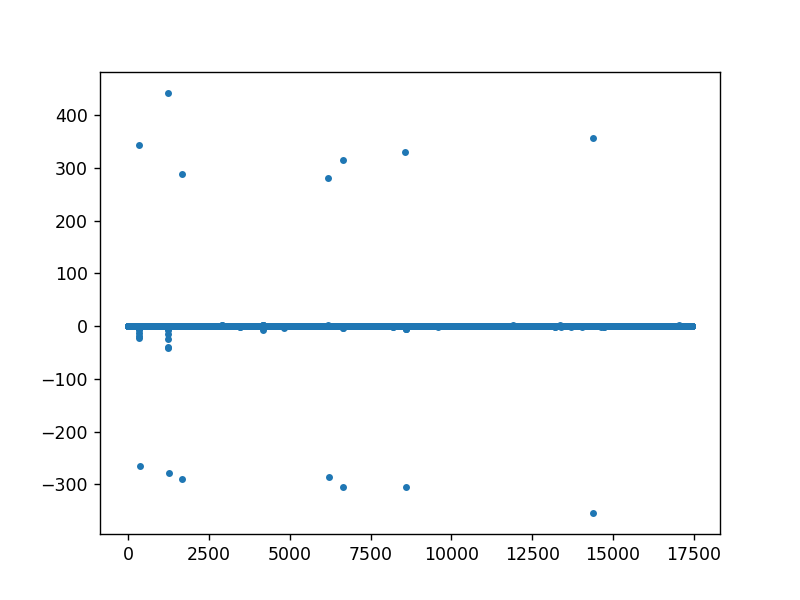

In [31]:
plt.figure()
plt.plot(diff_temp_diff_pre, '.')

In [32]:
mapa